# Part I - (Ford GoBike System Data Exploration and Visualisation)
## by (Oloruntoba James Moritiwon)

## Table of content

> 1.  [Introduction](#Introduction)
> 2.  [Preliminary wrangling](#PreliminaryWrangling)
>> 2.1 [Assessing data](#Assessing)
>>
>> 2.2 [Cleaning data](#Cleaning)
> 3.  [Univariate](#Univariate)
> 4.  [Bivariate](#Bivariate)
> 5.  [Multivariate](#Multivariate)
> 6.  [Conclusions](#Conclusions)
> 7.  [References](#ref)


 ## 1. Introduction <div id ='Introduction'></div>

> Ford GoBike System now rebranded as Bay Wheels is the first regional and large-scale bicycle sharing system deployed in California and on the West Coast of the United States. As of January 2018, the Bay Wheels system had over 2,600 bicycles in 262 stations across San Francisco, East Bay and San Jose. The system is expected to expand to 7,000 bicycles around 540 stations in San Francisco, Oakland, Berkeley, Emeryville, and San Jose. The bicycles are available 24 hours a day, 365 days a year. Customers may choose from a number of options ranging from a single ride to an annual membership.



 ## 2. Preliminary Wrangling <div id ='PreliminaryWrangling'></div>

In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.offline as pf
import plotly.graph_objs as go
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
import requests
import os

%matplotlib inline

Downloading dataset using requests


In [2]:
# # Creating a folder to store the files.
# folder = "Project_33" 

# # Checking if the folder already exist.
# if not folder in os.listdir():
#     os.mkdir(folder)  # Creating the folder if Project_33 does not exist.
    
# # downloading whole year data from BetaNYC github archive.    
# url = 'https://video.udacity-data.com/topher/2020/October/5f91cf38_201902-fordgobike-tripdata/201902-fordgobike-tripdata.csv'

# response = requests.get(url)
# with open(os.path.join(folder,url.split('/')[-1].replace('-','_')), mode = 'wb') as file:  # specifying the file name.
#             file.write(response.content)      # Saving the object.

In [3]:
# import fordgobike datafile into pandas dataframe
df_bike = pd.read_csv('Project_33/201902-fordgobike-tripdata.csv')
df_bike.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
0,52185,2019-02-28 17:32:10.1450,2019-03-01 08:01:55.9750,21.0,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,13.0,Commercial St at Montgomery St,37.794231,-122.402923,4902,Customer,1984.0,Male,No
1,42521,2019-02-28 18:53:21.7890,2019-03-01 06:42:03.0560,23.0,The Embarcadero at Steuart St,37.791464,-122.391034,81.0,Berry St at 4th St,37.775880,-122.393170,2535,Customer,NaN,NaN,No
2,61854,2019-02-28 12:13:13.2180,2019-03-01 05:24:08.1460,86.0,Market St at Dolores St,37.769305,-122.426826,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,5905,Customer,1972.0,Male,No
3,36490,2019-02-28 17:54:26.0100,2019-03-01 04:02:36.8420,375.0,Grove St at Masonic Ave,37.774836,-122.446546,70.0,Central Ave at Fell St,37.773311,-122.444293,6638,Subscriber,1989.0,Other,No
4,1585,2019-02-28 23:54:18.5490,2019-03-01 00:20:44.0740,7.0,Frank H Ogawa Plaza,37.804562,-122.271738,222.0,10th Ave at E 15th St,37.792714,-122.248780,4898,Subscriber,1974.0,Male,Yes


## Assessing Data <div id ='Assessing'></div>
> The fordgobike csv file imported into df_bike dataframe would be assessed to discover dirty and messy data issues to determine and to guide subsequent wrangling processes.

In [4]:
# get a tuple displaying rows and columns of the dataset using '.shape' code
df_bike.shape

(183412, 16)

**Comment**
>The dataset under review contains 183412 observations and 16 variables nonetheless;
>
>1. Wrong datatype visually detected in 'start_time', 'end_time', 'start_station_id', 'end_station_id', 'bike_id', 'user_type' and'member_gender' columns.

In [5]:
# display general information about the dataset using '.info()' code
df_bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183412 entries, 0 to 183411
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   duration_sec             183412 non-null  int64  
 1   start_time               183412 non-null  object 
 2   end_time                 183412 non-null  object 
 3   start_station_id         183215 non-null  float64
 4   start_station_name       183215 non-null  object 
 5   start_station_latitude   183412 non-null  float64
 6   start_station_longitude  183412 non-null  float64
 7   end_station_id           183215 non-null  float64
 8   end_station_name         183215 non-null  object 
 9   end_station_latitude     183412 non-null  float64
 10  end_station_longitude    183412 non-null  float64
 11  bike_id                  183412 non-null  int64  
 12  user_type                183412 non-null  object 
 13  member_birth_year        175147 non-null  float64
 14  memb

**Comment**

> non-null counts for some columns  were bellow 183412 in some columns indicating that some values are missing. A sum of these missing values would be coalated on column basis.
>

Checking for missing values

In [6]:
# obtain a sum of missing values in every column of the dataset
df_bike.isna().sum()

duration_sec                  0
start_time                    0
end_time                      0
start_station_id            197
start_station_name          197
start_station_latitude        0
start_station_longitude       0
end_station_id              197
end_station_name            197
end_station_latitude          0
end_station_longitude         0
bike_id                       0
user_type                     0
member_birth_year          8265
member_gender              8265
bike_share_for_all_trip       0
dtype: int64

**Comment**
>
> Missing values found in 'start_station_name', 'end_station_name', 'start_station_id', 'end_station_id', 'member_birth_year ' and 'member_gender' columns.

Checking for duplicated data

In [7]:
# obtain a sum of duplicates in the dataset
df_bike.duplicated().sum()

0

**Comment**
> There are no duplicates in the dataset

Verify genders of riders in the dataset

In [8]:
# check for number of riders by gender using value counts
df_bike.member_gender.value_counts()

Male      130651
Female     40844
Other       3652
Name: member_gender, dtype: int64

**Comment**
>
> There are roughly three times more male compared to females in the dataset and almost two times more males than all other gender combined together!

Verifying type of users represented in the dataset


In [9]:
# check for use types preferred by riders using value counts
df_bike.user_type.value_counts()

Subscriber    163544
Customer       19868
Name: user_type, dtype: int64

Verifying how many riders would share a bike for all trips

In [10]:
# check for bike share preference for all trip undertaken by riders using value counts
df_bike.bike_share_for_all_trip.value_counts()

No     166053
Yes     17359
Name: bike_share_for_all_trip, dtype: int64

**Comment**
>
> There are roughly 8 times more subscribers than customer represented in the dataset!

Verifying type of users represented in the dataset


In [11]:
# Display the statistics duration time for rides in the data set
df_bike.duration_sec.describe()

count    183412.000000
mean        726.078435
std        1794.389780
min          61.000000
25%         325.000000
50%         514.000000
75%         796.000000
max       85444.000000
Name: duration_sec, dtype: float64

**Comment**
>
> The average duration for rides is 726.078 s while 61 and 85444 s are minimum and maximum ride times presented by the dataset!


## Cleaning data <div id ='Cleaning'></div>

>Minor issues detected during assessment would be cleaned afterwards, manupulation of data for better visualisation would be done. few examples of this manupulation include generating new columns from existing ones and grouping of relevant data.
> A copy of the dataset would be made to preserve original data while the copy undergo wrangling

Creating a copy of df_bike dataset as df_gobike

In [12]:
# creating a copy of the dataset 
df_gobike = df_bike.copy()

**Cleaning Issue 2 - Missing values in some colums of the dataset**

Drop rows with missing 

In [13]:
# drop missing values from dataframe 
df_gobike.dropna(inplace=True)

# test result by scanning for missing values again
df_gobike.isnull().sum()

duration_sec               0
start_time                 0
end_time                   0
start_station_id           0
start_station_name         0
start_station_latitude     0
start_station_longitude    0
end_station_id             0
end_station_name           0
end_station_latitude       0
end_station_longitude      0
bike_id                    0
user_type                  0
member_birth_year          0
member_gender              0
bike_share_for_all_trip    0
dtype: int64


**Cleaning Issue 1 - Wrong data types in some colums of the dataset**

Convert timestamps to datetime

In [14]:
# convert start and end times to datetime
df_gobike['start_time'] = pd.to_datetime(df_gobike['start_time'])
df_gobike['end_time'] = pd.to_datetime(df_gobike['end_time'])

# test result of conversion by requesting for datatypes
df_gobike.dtypes

duration_sec                        int64
start_time                 datetime64[ns]
end_time                   datetime64[ns]
start_station_id                  float64
start_station_name                 object
start_station_latitude            float64
start_station_longitude           float64
end_station_id                    float64
end_station_name                   object
end_station_latitude              float64
end_station_longitude             float64
bike_id                             int64
user_type                          object
member_birth_year                 float64
member_gender                      object
bike_share_for_all_trip            object
dtype: object

Convert floats and integers to strings

In [15]:
# convert start, end stations and bike ids to strings
df_gobike['start_station_id'] = df_gobike['start_station_id'].astype('str')
df_gobike['end_station_id'] = df_gobike['end_station_id'].astype('str')
df_bike['bike_id'] = df_gobike['bike_id'].astype('str')

# visualise result of conversion by displaying first 3 rows
df_gobike.head(3)

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
0,52185,2019-02-28 17:32:10.145,2019-03-01 08:01:55.975,21.0,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,13.0,Commercial St at Montgomery St,37.794231,-122.402923,4902,Customer,1984.0,Male,No
2,61854,2019-02-28 12:13:13.218,2019-03-01 05:24:08.146,86.0,Market St at Dolores St,37.769305,-122.426826,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,5905,Customer,1972.0,Male,No
3,36490,2019-02-28 17:54:26.010,2019-03-01 04:02:36.842,375.0,Grove St at Masonic Ave,37.774836,-122.446546,70.0,Central Ave at Fell St,37.773311,-122.444293,6638,Subscriber,1989.0,Other,No


Convert to categorical data 

In [16]:
# converting user type to ordered categorical data
twousers = ['Customer', 'Subscriber']
userscat = pd.api.types.CategoricalDtype(ordered=True, categories=twousers)
df_gobike['user_type'] = df_gobike['user_type'].astype(userscat)

In [17]:
# converting bike_share_for_all_trip to ordered categorical data
sharebike = ['No', 'Yes']
sharecat = pd.api.types.CategoricalDtype(ordered=True, categories=sharebike)
df_gobike['bike_share_for_all_trip'] = df_gobike['bike_share_for_all_trip'].astype(sharecat)

In [18]:
# convert member gender to categorical data
df_gobike['member_gender'] = df_gobike['member_gender'].astype('category')

# test result of conversion by requesting for datatypes
df_gobike.dtypes

duration_sec                        int64
start_time                 datetime64[ns]
end_time                   datetime64[ns]
start_station_id                   object
start_station_name                 object
start_station_latitude            float64
start_station_longitude           float64
end_station_id                     object
end_station_name                   object
end_station_latitude              float64
end_station_longitude             float64
bike_id                             int64
user_type                        category
member_birth_year                 float64
member_gender                    category
bike_share_for_all_trip          category
dtype: object

Convert Float to integer

In [19]:
# Convert birth year to to integers
df_gobike['member_birth_year'] = df_gobike['member_birth_year'].astype('int')

# test result of conversion by requesting for datatypes
df_gobike.dtypes

duration_sec                        int64
start_time                 datetime64[ns]
end_time                   datetime64[ns]
start_station_id                   object
start_station_name                 object
start_station_latitude            float64
start_station_longitude           float64
end_station_id                     object
end_station_name                   object
end_station_latitude              float64
end_station_longitude             float64
bike_id                             int64
user_type                        category
member_birth_year                   int32
member_gender                    category
bike_share_for_all_trip          category
dtype: object

**3. Other issues resolved**

Add a new column to contain ages of riders in the dataset.
> The data does not extend beyond 02/2019, ages of riders as at 2019 would be computed instead of present day 2022.

In [20]:
# Compute and add a new column from 'member_birth_year' to contain ages of  riders
df_gobike['riders_age'] = 2019 - df_gobike['member_birth_year']

# Convert riders age to integers
df_gobike['riders_age'] = df_gobike['riders_age'].astype('int')

# test result of addition and conversion of the riders_age column
print(df_gobike.riders_age.dtype)

# describe
df_gobike.riders_age.describe()

int32


count    174952.000000
mean         34.196865
std          10.118731
min          18.000000
25%          27.000000
50%          32.000000
75%          39.000000
max         141.000000
Name: riders_age, dtype: float64

**Comments**

> 1. Row counts are now down from 183412 to 174952 due to removal of missing values.
> 2. Pandas describe prints results as floats nevertheless, riders_age entries are now integers.
> 3. Outliers were discovered from the statistics of riders_age column. Maximum age can be seen as 141 years which has made assessing and cleaning iterative.
>>People of ages above 80 years are considered outliers because of the perception that they may be too old  to ride on bikes.

Check for outliers of ages of above 80 years by grouping riders into age brackets
<div id ='bracketing'></div>


In [21]:
# creating edges, labels and using of pandas cut for age bracketing 
edges = [0, 20, 35, 60, 70, 100, 141]
df_gobike['age_brackets'] = pd.cut(df_gobike['riders_age'], edges, labels = ['teenagers', 'young_adults','Adults',\
                                                        'retirees','senior_citizens', 'centenarians'])

[go back to viz](#goback) 

In [22]:
# how many riders fall into these brackets
df_gobike['age_brackets'].value_counts(sort = False)

teenagers            4213
young_adults       109811
Adults              57398
retirees             2955
senior_citizens       503
centenarians           72
Name: age_brackets, dtype: int64

There are 72 centinarians to be exempted from this analysis also there are 503 persons aged between 70 and 100 years.

In [23]:
# use the query method to filter dataframe
df_gobike = df_gobike.query('riders_age <=80')

# test result of filter by describing riders_age column again
df_gobike.riders_age.describe()

count    174760.000000
mean         34.125223
std           9.877739
min          18.000000
25%          27.000000
50%          32.000000
75%          39.000000
max          80.000000
Name: riders_age, dtype: float64

Convert age brackets to ordered categorical data

In [24]:
# recreating edges, labels and using of pandas cut for age bracketing
edges = [0, 20, 35, 60, 70, 80]
df_gobike['age_brackets'] = pd.cut(df_gobike['riders_age'], edges, labels = ['teenagers', 'young_adults','Adults',\
                                                        'retirees','senior_citizens'])

# converting to ordered categorical data
ageclass = ['teenagers', 'young_adults','Adults','retirees','senior_citizens']
agecat = pd.api.types.CategoricalDtype(ordered=True, categories=ageclass)
df_gobike['age_brackets'] = df_gobike['age_brackets'].astype(agecat)

# Check the number of riders by age brackets after filter
df_gobike['age_brackets'].value_counts(sort = False)

teenagers            4213
young_adults       109811
Adults              57398
retirees             2955
senior_citizens       383
Name: age_brackets, dtype: int64

**Comments**

Maximum age in the dataset is now 80 years, only 119 senior citizens and all centinarians were filtered out. Observation counts has reduced from 174952 to 174760!

**Append new columns for easier analysis**

Add a new column to contain ages of riders in the dataset.convert age brackets to ordered categorical data
> 1. Add duration_minutes column to remove ambigous values of time presented in sec.
> 2. Add ride_start_24hour to help compare ride start time by 24 hour system during analysis.
> 3. Add ride_start_day to help compare rides by start days of the week during analysis.

Conversion to the right datatype would be done in tandem with these aditions where necessary.

In [25]:
# compute ride duration in minutes from duration_sec column
df_gobike['duration_minute'] = df_gobike['duration_sec']/60

# print 3 rows to console to confirm sucessful computation
df_gobike.head(3)

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip,riders_age,age_brackets,duration_minute
0,52185,2019-02-28 17:32:10.145,2019-03-01 08:01:55.975,21.0,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,13.0,Commercial St at Montgomery St,37.794231,-122.402923,4902,Customer,1984,Male,No,35,young_adults,869.750000
2,61854,2019-02-28 12:13:13.218,2019-03-01 05:24:08.146,86.0,Market St at Dolores St,37.769305,-122.426826,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,5905,Customer,1972,Male,No,47,Adults,1030.900000
3,36490,2019-02-28 17:54:26.010,2019-03-01 04:02:36.842,375.0,Grove St at Masonic Ave,37.774836,-122.446546,70.0,Central Ave at Fell St,37.773311,-122.444293,6638,Subscriber,1989,Other,No,30,young_adults,608.166667


In [26]:
# compute and append ride_start_24hour from start_time column
df_gobike['ride_start_24hour'] = df_gobike.start_time.dt.strftime('%H')

# convert ride_start_24hour to integer
df_gobike['ride_start_24hour'] = df_gobike['ride_start_24hour'].astype(int)

# print 3 rows to console to confirm sucessful computation
df_gobike.head(3)

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip,riders_age,age_brackets,duration_minute,ride_start_24hour
0,52185,2019-02-28 17:32:10.145,2019-03-01 08:01:55.975,21.0,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,13.0,Commercial St at Montgomery St,37.794231,-122.402923,4902,Customer,1984,Male,No,35,young_adults,869.750000,17
2,61854,2019-02-28 12:13:13.218,2019-03-01 05:24:08.146,86.0,Market St at Dolores St,37.769305,-122.426826,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,5905,Customer,1972,Male,No,47,Adults,1030.900000,12
3,36490,2019-02-28 17:54:26.010,2019-03-01 04:02:36.842,375.0,Grove St at Masonic Ave,37.774836,-122.446546,70.0,Central Ave at Fell St,37.773311,-122.444293,6638,Subscriber,1989,Other,No,30,young_adults,608.166667,17


Compute rides start by days of the week and convert to categorical data

In [27]:
# compute and append ride_start_day from start_time column
df_gobike['ride_start_day'] = df_gobike.start_time.dt.strftime('%A')

# convert ride_start_day to categorical datatype
weekday = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weeklycat = pd.api.types.CategoricalDtype(ordered=True, categories=weekday)
df_gobike['ride_start_day'] = df_gobike['ride_start_day'].astype(weeklycat)

# test using .dtype to confirm datatype conversion and print
print(df_gobike.ride_start_day.dtype)

# print 3 rows to console to confirm sucessful computation
df_gobike.tail(3)

category


,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,...,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip,riders_age,age_brackets,duration_minute,ride_start_24hour,ride_start_day
183409,141,2019-02-01 00:06:05.549,2019-02-01 00:08:27.220,278.0,The Alameda at Bush St,37.331932,-121.904888,277.0,Morrison Ave at Julian St,37.333658,...,3824,Subscriber,1990,Male,Yes,29,young_adults,2.350000,0,Friday
183410,139,2019-02-01 00:05:34.360,2019-02-01 00:07:54.287,220.0,San Pablo Ave at MLK Jr Way,37.811351,-122.273422,216.0,San Pablo Ave at 27th St,37.817827,...,5095,Subscriber,1988,Male,No,31,young_adults,2.316667,0,Friday
183411,271,2019-02-01 00:00:20.636,2019-02-01 00:04:52.058,24.0,Spear St at Folsom St,37.789677,-122.390428,37.0,2nd St at Folsom St,37.785000,...,1057,Subscriber,1989,Male,No,30,young_adults,4.516667,0,Friday


In [28]:
#display general info about clean copy of dataset
df_gobike.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 174760 entries, 0 to 183411
Data columns (total 21 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   duration_sec             174760 non-null  int64         
 1   start_time               174760 non-null  datetime64[ns]
 2   end_time                 174760 non-null  datetime64[ns]
 3   start_station_id         174760 non-null  object        
 4   start_station_name       174760 non-null  object        
 5   start_station_latitude   174760 non-null  float64       
 6   start_station_longitude  174760 non-null  float64       
 7   end_station_id           174760 non-null  object        
 8   end_station_name         174760 non-null  object        
 9   end_station_latitude     174760 non-null  float64       
 10  end_station_longitude    174760 non-null  float64       
 11  bike_id                  174760 non-null  int64         
 12  user_type       

Save the clean copy into 201902-cleanfordgobike-tripdata.csv

In [29]:
df_gobike.to_csv('project_33/201902-cleanfordgobike-tripdata.csv', index=False)

### What is the structure of your dataset?

> The raw data contains approximately 183412 observations of individual rides under 16 columns. These columns can be classified into :
> - Time measurements (duration_sec, start_time, end_time), 
> - station details (start_station_id, start_station_name, start_station_latitude, start_station_longitude, end_station_id, >>, end_station_latitude, end_station_longitude) and, 
> - riders details categories (bike_id, user_type, member_birth_year, member_gender, bike_share_for_all_trip):
>
>The cleaned dataset however contained 5 derived variables in addition to the original ones to make 21 columns. They are
Derived features/variables to assist exploration and analysis:
> - Ride start details: duration_minute, ride_start_24hour, ride_start_day, 
> - riders derived details: riders_age, age_brackets

### What is/are the main feature(s) of interest in your dataset?

> My Interest is centered around exploring bike trips' duration and rental events and how it relates to riders descriptions like age, gender and user types. I would guide my eploration interest with questions like When are most trips taken in terms of time of day, day of the week, How long does the average trip take? Does the above depend on if a user is a subscriber or customer ?

### What features in the dataset do you think will help support your investigation into your feature(s) of interest?

> Information about time measurements and ride start details  would help understand the hows? and when? for individual trips undertaken. More so, target customers and customer groups can be identified easily with the help of riders detail. This can useful for  bike usage data investigation to possibly detect any peculiarity related to riders or group of riders.

## Univariate Exploration <div id ='Univariate'></div>


**Question 1**: 
> What is the age range of gobike riders in Bay area as at 02/2019? The largest bike-share riders are of which age?

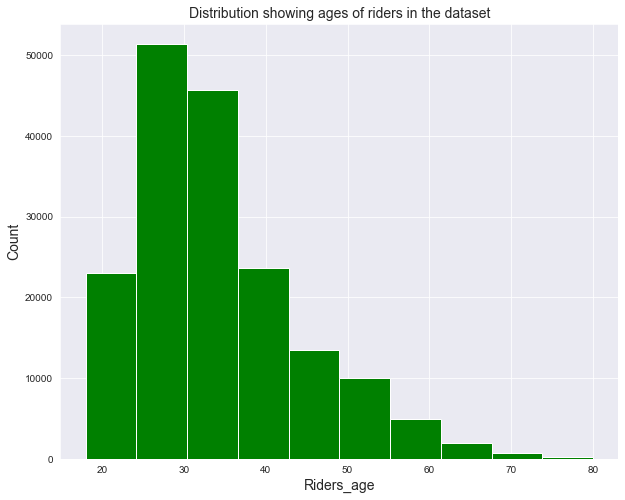

In [30]:
# univariate plot of age distribution of riders in the dataset
sns.set_style('darkgrid')

fig = plt.figure(figsize =(10,8))

def plot_hist(ax):
    plt.hist(ax, color = 'g')
    plt.title('Distribution showing ages of riders in the dataset', fontsize=14)
    plt.xlabel('Riders_age', fontsize=14)
    plt.ylabel('Count', fontsize=14)  
    
if __name__ == '__main__':
    above = df_gobike['riders_age']
    plot_hist(above)       

**Comments:**

>The age distribution of gobike riders is between 18 to 80 years in February 2019. Certainly, entries older than 80 years were filtered out earlier, all the same, it may be inferred that the bike sharing service requre that individuals be 18 years and older. The chart showed a sharp increase initially and peaked at 30 years.It then began to decline (sharply between 30 and 40 years and at approximately steady rate afterward). This implies that ride sharing habit tilts toward youthfulness compared to full adulthood.

**Question 2**: <div id ='goback'></div>
> Which age category should be targetted to improve gobike ride sharing patronage? go into details beyond age distribution with 02/2019 clean data. 

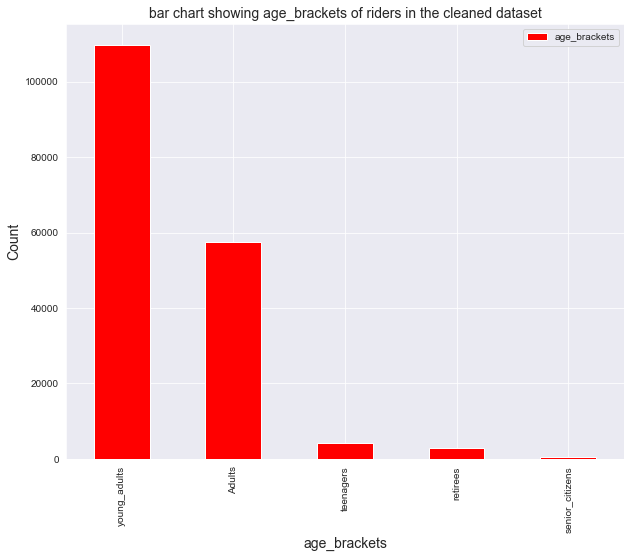

In [31]:
# univariate plot of age_brackets
fig, ax = plt.subplots(figsize =(10,8))

df_gobike['age_brackets'].value_counts().plot(kind='bar', color = 'r')

# set title, axes labels and fontsize
ax.set_title('bar chart showing age_brackets of riders in the cleaned dataset', fontsize = 14)
ax.set_xlabel('age_brackets', fontsize=14)
ax.set_ylabel('Count',fontsize=14)
ax.legend(loc='upper right')
plt.show();

**Comments:**

>Consider classification done in [Age bracket](#bracketing) above, young adults of Bay area patronised gobike ride sharing service more than all other age brackets combined in February 2019! Therefore, adverts and premiums should be designed to attract more young adults and be flexible to accomodate and encourage other age brackets. 

**Question 3**: 
> How willing are gobike bike sharing clients to share bike for all trip?

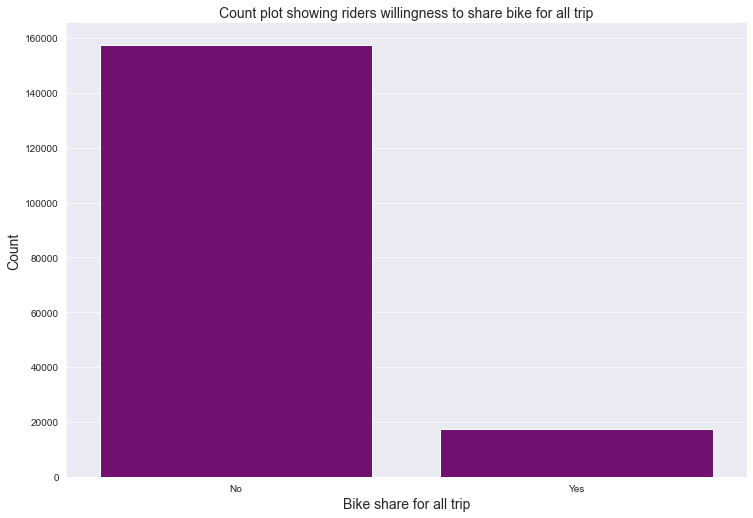

In [32]:
# univariate plot of bike share for all trip types
sns.catplot(data=df_gobike, x='bike_share_for_all_trip', color = 'purple', kind = 'count', height = 7, aspect  = 1.5);
plt.xlabel('Bike share for all trip',fontsize = 14);
plt.ylabel('Count', fontsize = 14);

# set title using matplotlib 
plt.title('Count plot showing riders willingness to share bike for all trip', fontsize = 14);

**Comments:**

> From the chart of bike share for all trips, it can be seen that gobike riders were more eight times less willing to share bike for all trips in February 2019. This should guide an informed decision to purchase more bikes to match numbers of unwilling riders assign bikes for all trips.

**Question 4**: 
> What is the user preference for gobike ride sharing service? how likely are they to suscribe? 

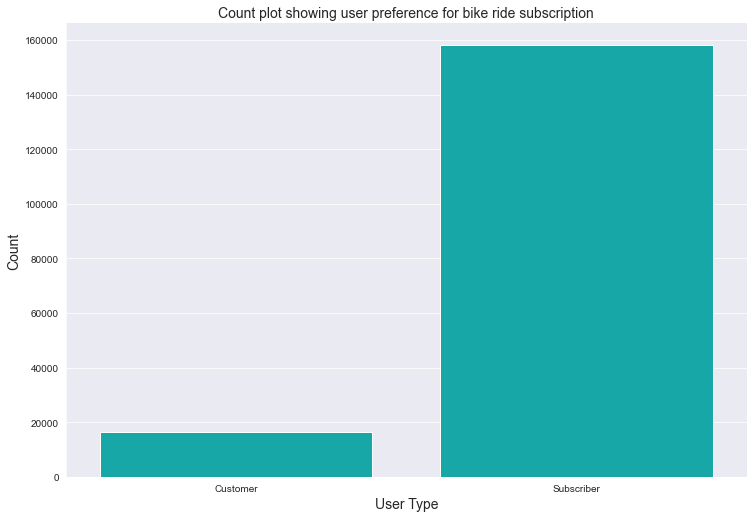

In [33]:
# univariate plot of user types
sns.catplot(data=df_gobike, x='user_type', color = 'c', kind = 'count', height = 7, aspect  = 1.5);
plt.xlabel('User Type', fontsize = 14);
plt.ylabel('Count', fontsize = 14);

# set title using matplotlib 
plt.title('Count plot showing user preference for bike ride subscription', fontsize = 14);

**Comments:**

>From the chart of user preference, it can be seen that their was more than eight times subscribers than there were customers for all trips in February 2019. This may be attributed to frequent trips using the bike-sharing service. Frequent trips are easier to undertake with a subscription compared to being a customer. Therefore, bike sharing subscribtions should be made accessible and robust.

**Question 5**: 
> What is the gender composition of gobike riders captured in the dataset

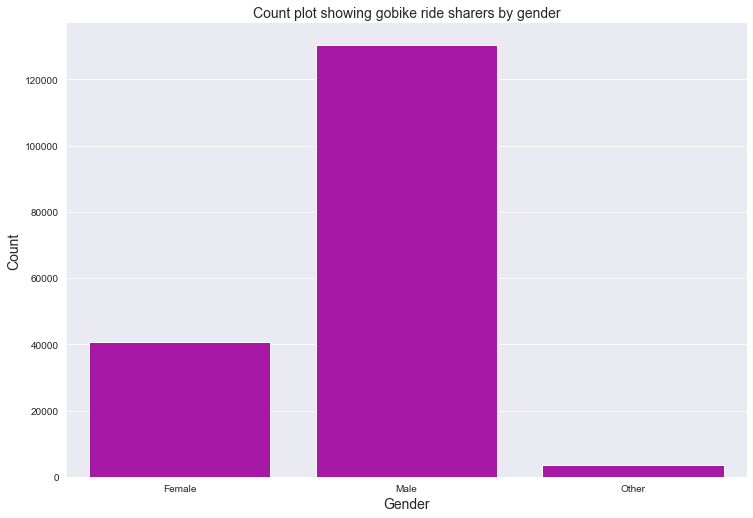

In [34]:
# univariate plot of member gender
sns.catplot(data=df_gobike, x='member_gender', color = 'm',kind = 'count', height = 7, aspect  = 1.5);
plt.xlabel('Gender', fontsize = 14);
plt.ylabel('Count', fontsize = 14);

# set title using matplotlib 
plt.title('Count plot showing gobike ride sharers by gender', fontsize = 14);

**Comments:**

>From the chart of gender count, it can be seen that there are about three times more male than there were females. Also, other gender category is less than a quarter of females represented by February 2019 cleandata. This may be attributed to the active and outgoing nature of males and the suitability of bike designs and handling to the male gender.

**Question 6**: 
> How likely would a bike sharing trip start during the hours of the day?

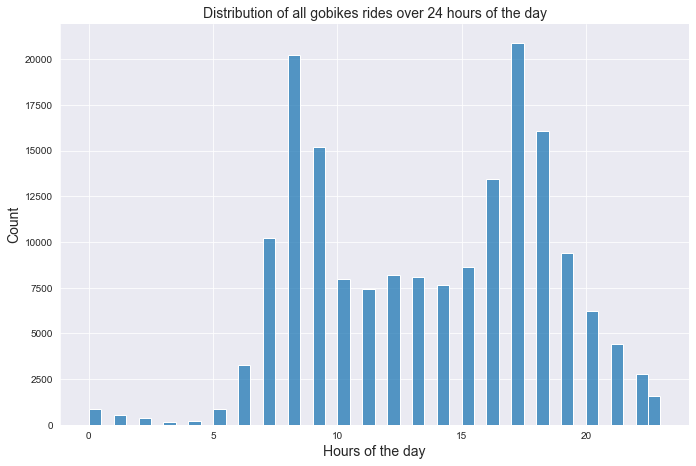

In [35]:
# univariate plot of amount of rides within 24 hours of the day
bin_edges = np.arange(0, df_gobike['ride_start_24hour'].max()+0.5, 0.5)
sns.displot(data = df_gobike, x = 'ride_start_24hour', bins = bin_edges, height=6.27, aspect=9.7/6.27);
plt.xlabel('Hours of the day', fontsize = 14);
plt.ylabel('Count', fontsize = 14);

# set title using matplotlib 
plt.title('Distribution of all gobikes rides over 24 hours of the day', fontsize = 14);

**Comments:**

>From the plot, there are two peaks- each surrounded by two other minor peaks in the same pattern. These major peaks corresponds to the 8th (8am) and the 17th hour (5pm) of the day. The pattern identified around the two peaks indicates an exodus of gobike sharing riders which may be attributed to commuting to and fro from work. The most preferred start hour is the 17th hour however, its only slightly preffered than the 8th hour of the day.

**Question 7**: 
> Which day of the week account for the most ride starts?

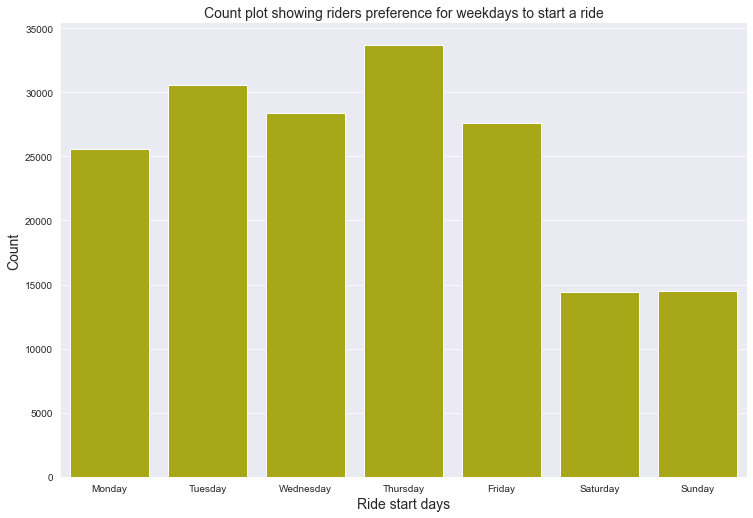

In [36]:
# univariate plot counts of ride start days
sns.catplot(data=df_gobike, x='ride_start_day', color = 'y', kind = 'count', height = 7, aspect  = 1.5);
plt.xlabel('Ride start days', fontsize = 14);
plt.ylabel('Count', fontsize = 14);

# set title using matplotlib 
plt.title('Count plot showing riders preference for weekdays to start a ride', fontsize = 14);

**Comments:**

> The highest number of rides in February 2019 were started on a Thursday and rides started on Tuesdays were 8 % lesser than Thursday peak. However, Saturday and Sunday witnessed an identically low ride starts. Infrequent ride starts on weekends may be attributed to the need to cummute to work on workdays, not weekends.

### Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformations?

> Transformations were pre-empted at the assessing stage to ensure clean and straight foward visualisations. The highest number of rides in February 2019 were started on a Thursday and rides started on Tuesdays were 8 % lesser than Thursday peak and highest ride starts are witnessesed at the 8th (8am) and the 17th hour (5pm) of the day. 

### Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?

> Unusual age distribution of centinarians was detected in the accessing stage and was cleaned by filtering before visualisations. This was done to make the data realistic as people of that age are perceived as unable to share rides.

## Bivariate Exploration <div id ='Bivariate'></div>

> In this section, investigate relationships between pairs of variables in your
data. Make sure the variables that you cover here have been introduced in some
fashion in the previous section (univariate exploration).

**Question 8**: 
> What is the age distribution of gobike riders captured in the dataset

In [37]:
# bivariate plots of ride_start_24 hour and age_bracket
# ref 1
fig = px.box(df_gobike, x='age_brackets', y='ride_start_24hour',
             title ='bax plot showing start hour preference for rides by age_brackets');

fig.show();
pf.plot(fig, filename='brackets.html');

**Comments:**

> This box plot shows the three quartile values of ride starts in 24 hours. The “whiskers” extend to points that lie within 1.5 IQRs of the lower and upper quartile, and then observations that fall outside this range are displayed independently. This means that each value in the boxplot corresponds to an actual observation in the data. All age brackets compared favourably to each other however, tennagers tend to start more trips at the 15th hour more than any other age group.

**Question 9**: 
> What is the average duration of bike share trips initiated for each day of the week? on which day(s) is/are longer trips likely to take place?

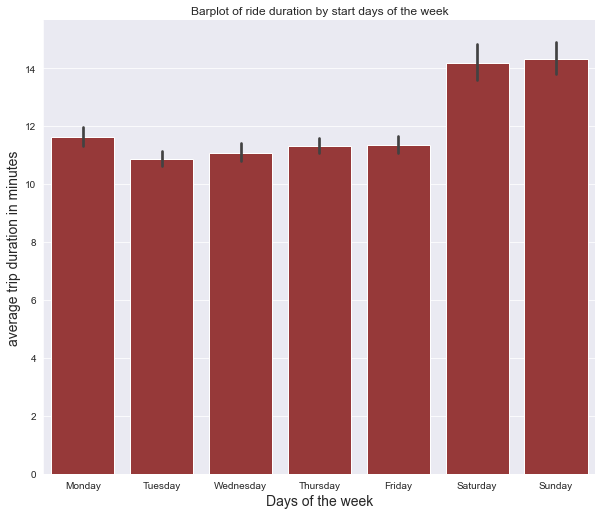

In [38]:
# bivariate barplot of ride duration by start days of the week

sns.catplot(data=df_gobike, x= 'ride_start_day', y= 'duration_minute', color = 'brown',
            kind = 'bar', height = 7, aspect  = 1.2).set(title= 'Barplot of ride duration by start days of the week');
plt.xlabel('Days of the week', fontsize = 14);
plt.ylabel('average trip duration in minutes', fontsize = 14);


**Comments:**

> The highest duration for trips undertaken in February 2019 took place on weekends. Therefore, saturdays and sundays are favoured for longer trips. This may be because of sight-seeing, excursions, travels and religious activities which might require longer trips compared to commuting to work for which trips are started on workdays.


**Question 10**: 
> What is the start hour preference for ride share users?

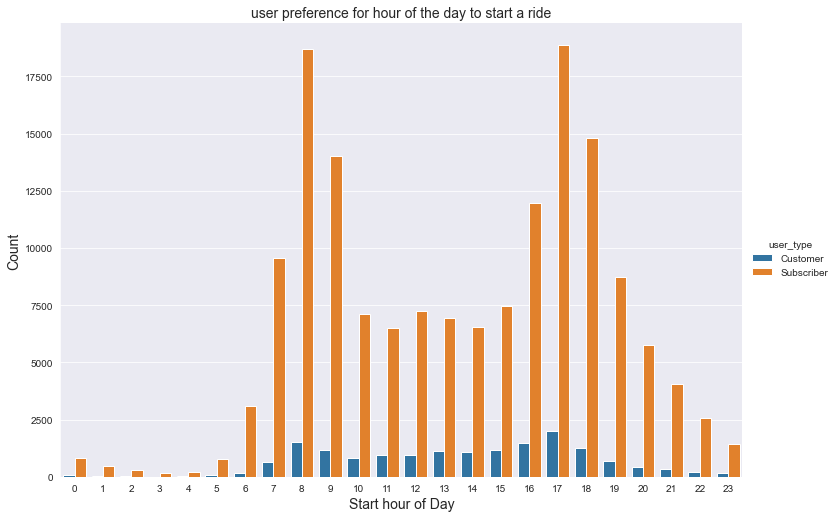

In [39]:
# plot user's preference for hour of the day to start a ride
sns.catplot(data=df_gobike, x='ride_start_24hour', hue='user_type', kind = 'count', height = 7, aspect  = 1.5);
plt.title('user preference for hour of the day to start a ride', fontsize = 14);
plt.xlabel('Start hour of Day', fontsize = 14);
plt.ylabel('Count', fontsize = 14);

**Comments:**

> Although there are more subscribers in the study, both user type have the same preference for start hour for rides at hours for which data are available. It is noteworthy that little or no customer started a trip in the first six hours of the day while subscribers are represented at every start hour. Therefore, it can be inferred that subscription to service encourages ride start at any hour of the day.

**Question 11**: 
> Would gobike riders like to share bike for all trip started at any hours of the day? are there odd hours for bike share?

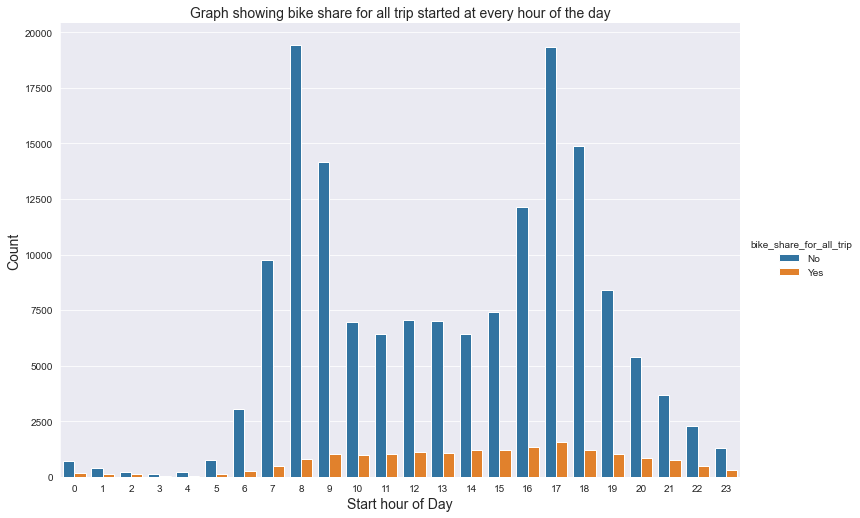

In [40]:
# Bivariate plot of start hour of the day and willingness to share bike for all trip
sns.catplot(data=df_gobike, x= 'ride_start_24hour', hue = 'bike_share_for_all_trip', kind = 'count', height = 7, aspect  = 1.5);
plt.title('Graph showing bike share for all trip started at every hour of the day', fontsize = 14);
plt.xlabel('Start hour of Day', fontsize = 14);
plt.ylabel('Count', fontsize = 14);

**Comments:**

> gokike riders are vocal about not sharing a bike for all trip regardless of the hour of the day for trip commencement. However, the 17th hour of the day (5pm) turned out to be the most probable compared to other hours. This may be atrributed to the rush hour and tired from close of work and not willingness.The seventeenth hour has the most of ride starts in the dataset.

**Question 12**: 
> Would gobike riders like to share bike for all trip started at any day of the week? are there odd days for bike share?

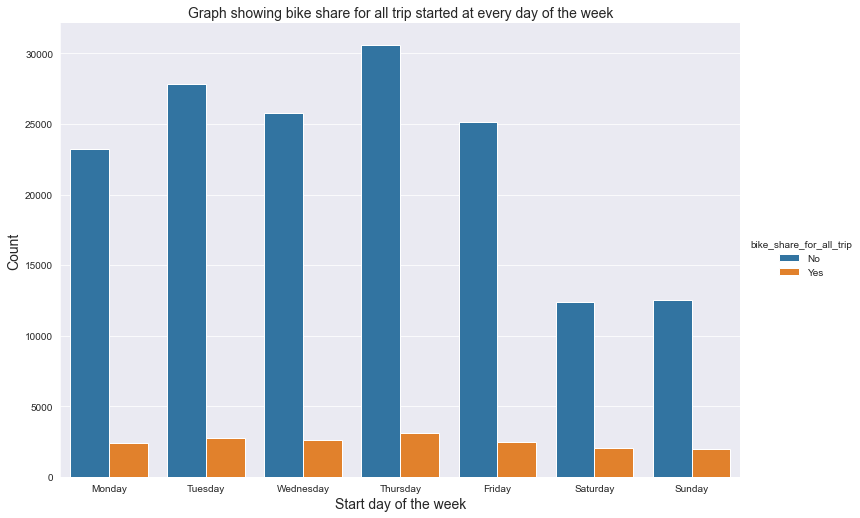

In [41]:
# Bivariate plot of start days of the week and willingness to share bike for all trip
sns.catplot(data=df_gobike, x= 'ride_start_day', hue = 'bike_share_for_all_trip', kind = 'count', height = 7, aspect  = 1.5);
plt.title('Graph showing bike share for all trip started at every day of the week', fontsize = 14);
plt.xlabel('Start day of the week', fontsize = 14);
plt.ylabel('Count', fontsize = 14);

**Comments:**

> gokike riders are vocal about not sharing a bike for all trip regardless of the days of the week of trip commencement. However, riders are less willing to share on a Thursday and on Tuesday. The average number of unwilling riders ranged from almost 13 times more on Tuesday to almost 5 times more than willing riders on Satudays and Sundays. No to bike share for all trips may be due to personal preference for bikes or personalised experience.

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?

> All age brackets compared favourably to each other however, tennagers tend to start more trips at the 15th hour (3pm) more than any other age group however, highest duration for trips undertaken in February 2019 happened on weekends. Both user types have the same preference for start hour for rides at hours for which data are available. 

### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?

> Gobike riders are vocal about not sharing a bike for all trip regardless of the hour of the day of trip commencement. The average number of willing riders ranged from almost 13 times lesser on Tuesday to almost 5 times lesser on Satudays and Sundays.


## Multivariate Exploration <div id ='Multivariate'></div>


**Question 13**: 
> How does age and gender affect user types? do both imply riders would subscribe or not?

In [42]:
# Ref 2
# Multivariate plot of riders age by usertype and gender

fig = px.violin(df_gobike, y='riders_age', x='user_type', color='member_gender', box=True,
                title ='Violin/box showing users type by their age and gender');
fig.show();
pf.plot(fig, filename='violins.html');

**Comments:**

> The age distribution gets too narrow for all user types and gender as the age advances and they've all got wider bells around the age of 30 years which indicates a patronage of young people. The other gender have got more older subscribers than all others while there are as much male casual riders as there are female subscribers less than 20 years of age. Infact, male riders of all ages tend to be as casual with trips as much as female riders would suscribe to trips. Their violins are similar in many ways. The other gender has the highest median value regardless of user type to pass as the most positive group toward the ride share service. 

**Question 14**: 

> What is the average duration of trips undertaken by user types started on days of the week?

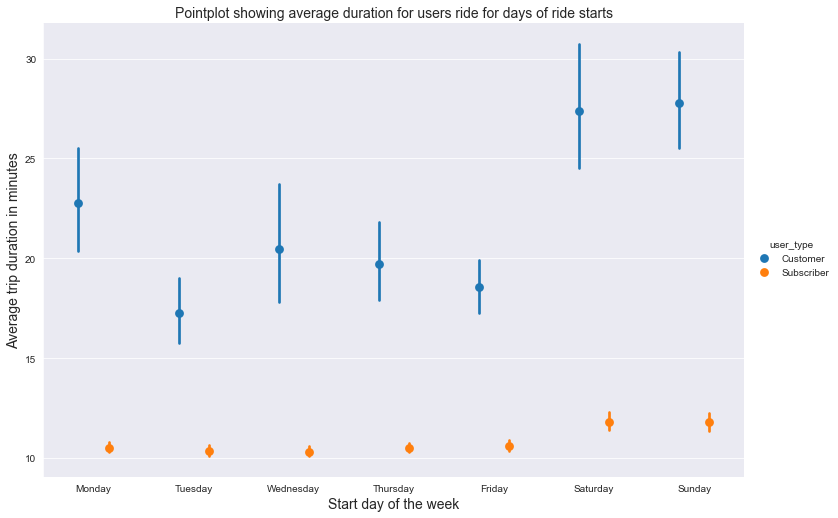

In [43]:
# Multivariate plot to compare start days to duration of rides by user type
sns.catplot(data = df_gobike, x = 'ride_start_day', y = 'duration_minute', 
              hue = 'user_type', kind = 'point',
              dodge=0.3, linestyles="", height=7, aspect=1.5);
plt.title('Pointplot showing average duration for users ride for days of ride starts', fontsize = 14);
plt.xlabel('Start day of the week', fontsize = 14);
plt.ylabel('Average trip duration in minutes', fontsize = 14);

**Comments:**

> Observing patterns in the plot, the average trip duration for customers is almost thrice compared to subscriber trips on Sundays. This is the widest gap between the two user types on the graph. The lowest difference can be seen on Tuesdays where average trip duration is a little less than double for customers compared to subscribers. This may imply that the casual user approach may be flexible for long rides. It may also indicate that riders prefer subscriptions for shorter rides and would rather book long rides casually outside their subscription cards.

**Question 15**: 
> What is the average duration of trips undertaken by each gender started on each days of the week?

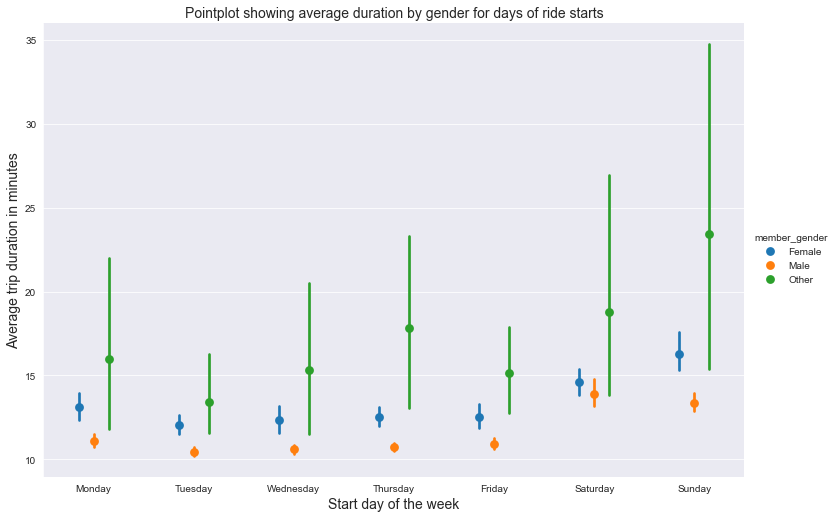

In [44]:
# Multivariate plot to compare start days to duration of rides by gender
sns.catplot(data = df_gobike, x = 'ride_start_day', y = 'duration_minute', kind = 'point',
              hue = 'member_gender', height =7, aspect=1.5,
              dodge=0.3, linestyles="");
plt.title('Pointplot showing average duration by gender for days of ride starts', fontsize = 14);
plt.xlabel('Start day of the week', fontsize = 14);
plt.ylabel('Average trip duration in minutes', fontsize = 14);

**Comments:**

> Observing patterns in the plot, the average duration of trip is highest for people of other gender and lowest for males on all days of the week. Weekends are prefered for longer trip start for all genders.

**Question 16**: 
> What is the average duration of trips for users willing to share a bike for all trip? What is the average trip for users who are unwilling?

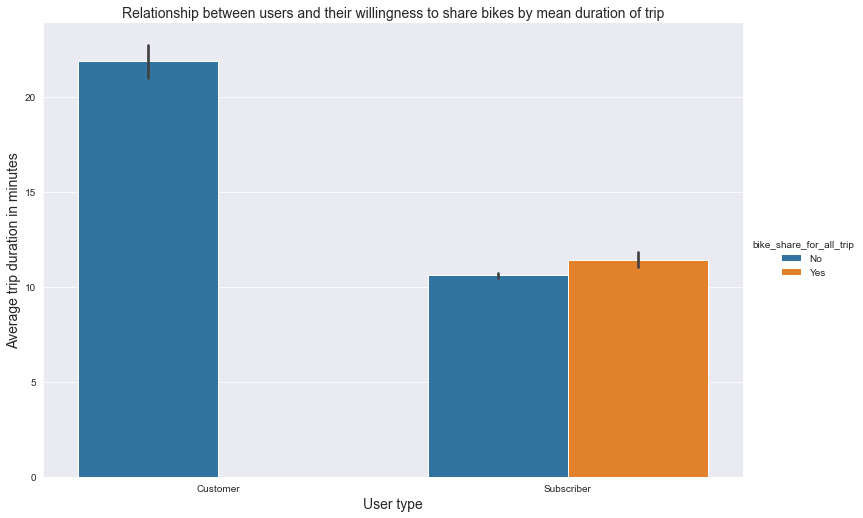

In [45]:
# multivariate plot of average duration of trips of users willing to share a bike for all trip
sns.catplot(data=df_gobike, x= 'user_type', y= 'duration_minute', hue = 'bike_share_for_all_trip',
            kind = 'bar', height =7, aspect=1.5);
plt.title('Relationship between users and their willingness to share bikes by mean duration of trip', fontsize = 14);
plt.xlabel('User type', fontsize = 14);
plt.ylabel('Average trip duration in minutes', fontsize = 14);

**Comments:**

> No customer is willing to share bike for all rides and interestingly, they have the highest averages for trip duration. This imply that  unique bike for all trip may be allocated to riders who identify as a casual rider. A little more subscriber are willing to share a ride for all trips. This behavior may be due to long term commitment of subscribers hence, almost willingness or not to share for all trips. Customers may make a one time long ride without sharing probably because they are not oblidged to undertake another trip like a subcriber would!

### Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?

> The average trip duration for customers is almost thrice compared to subscriber trips on Sundays but a little less than double Tuesdays. This compares the widest and closest gap between the two user types trip durations on days of the week. Also, the average duration of trip is highest for people of other gender and lowest for males on all days of the week.

### Were there any interesting or surprising interactions between features?

> No customer is willing to share bike for all rides and interestingly, they have the highest averages for trip duration!

## Conclusions <div id ='Conclusions'></div>
> The fordgobike csv file was imported into df_bike dataframe and assessed to discover cleanliness issues and some detcted one include missing values found in 'start_station_name', 'end_station_name', 'start_station_id', 'end_station_id', 'member_birth_year ' and 'member_gender' columns. These issues were resolved and new columns derived from existing ones an example is the riders_age derived from birth_year and duration_minutes from seconds.

> From the analysis done, all age brackets compared favourably to each other however, tennagers tend to start more trips at the 15th hour (3pm) than any other age group. Notably, the highest duration for trips undertaken in February 2019 happened on weekends and both user types have the same preference for start hour of the day for rides. Gobike riders are vocal about not sharing bike for all trip regardless of the hour of the day of trip commencement and the average number of unwilling riders ranged from almost 13 times more on Tuesday to almost 5 times more than willing riders on Satudays and Sundays.The average trip duration for customers is almost thrice compared to subscriber trips on Sundays but a little less than double on Tuesdays. This compares the widest and closest gap between the two user types trip durations by days of the week. Also, the average duration of trip is highest for people of other gender and lowest for males on all days of the week. No customer is willing to share bike for all rides and interestingly, they have the highest averages for trip duration!


>This implies that ride sharing habit tilts toward youthfulness compared to full adulthood and adverts and premiums should be designed to attract more young adults and be flexible to accomodate and encourage other age brackets.  Also, frequent trips are easier to undertake with a subscription compared to casual booking as a customer. Therefore, bike sharing subscribtions should be made accessible and robust.The most preferred start hour is the 17th hour however, its only slightly preferred than the 8th hour of the day. Infrequent ride-starts on weekends may be attributed to the need to cummute to work on workdays, and not on weekends.This may be because of sight-seeing, excursions, travels and religious activities which may require longer trips. In addition, it can be inferred that subscription to ride share service encourages ride start all hours of the day  with the seventeenth hour having most of ride starts. In like manner, the prominent 'No' to bike share for all trips may be due to personal preference for bikes or personalised experience and that casual approach as acustomer may be flexible for longer rides. It may also indicate that riders prefer subscriptions for shorter rides and would rather book long rides casually outside their subscription cards. Finally, Weekends are prefered for longer trip start for all genders. Customers may undertake a one time lenthy trip without sharing a bike probably because they are not oblidged to undertake another trip like a subcriber would!

## References <div id ='ref'></div>

> ref 1: https://plotly.com/python/reference/box/
>
> Ref 2: https://plotly.com/python/violin
